## Life Expectancy Prediction
-------------------

The project relies on accuracy of data. The Global Health Observatory (GHO) data repository under World Health Organization (WHO) keeps track of the health status as well as many other related factors for all countries The data-sets are made available to public for the purpose of health data analysis. The data-set related to life expectancy, health factors for 193 countries has been collected from the same WHO data repository website and its corresponding economic data was collected from United Nation website. Among all categories of health-related factors only those critical factors were chosen which are more representative. It has been observed that in the past 15 years , there has been a huge development in health sector resulting in improvement of human mortality rates especially in the developing nations in comparison to the past 30 years. Therefore, in this project we have considered data from year 2000-2015 for 193 countries for further analysis. The individual data files have been merged together into a single data-set. On initial visual inspection of the data showed some missing values. As the data-sets were from WHO, we found no evident errors. Missing data was handled in R software by using Missmap command. The result indicated that most of the missing data was for population, Hepatitis B and GDP. The missing data were from less known countries like Vanuatu, Tonga, Togo, Cabo Verde etc. Finding all data for these countries was difficult and hence, it was decided that we exclude these countries from the final model data-set. The final merged file(final dataset) consists of 22 Columns and 2938 rows which meant 20 predicting variables. All predicting variables was then divided into several broad categories:​Immunization related factors, Mortality factors, Economical factors and Social factors.

###### Inspiration 
The data-set aims to answer the following key questions:

1. Does various predicting factors which has been chosen initially really affect the Life expectancy? What are the predicting variables actually affecting the life expectancy?
2. Should a country having a lower life expectancy value(<65) increase its healthcare expenditure in order to improve its average lifespan?
3. How does Infant and Adult mortality rates affect life expectancy?
4. Does Life Expectancy has positive or negative correlation with eating habits, lifestyle, exercise, smoking, drinking alcohol etc.
5. What is the impact of schooling on the lifespan of humans?
6. Does Life Expectancy have positive or negative relationship with drinking alcohol?
7. Do densely populated countries tend to have lower life expectancy?
8. What is the impact of Immunization coverage on life Expectancy?

In [63]:
# Importing all the Required Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import datetime as dt
import warnings
plt.style.use('dark_background')
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns',None)
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

In [64]:
#Reading dataset
df=pd.read_csv('D:\Datasets of AB\Life Expectancy Data.csv')

In [65]:
df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [66]:
print('Dimension of Life Expectancy Data:', df.shape)

Dimension of Life Expectancy Data: (2938, 22)


In [67]:
#Index
print(f'Column names are :', list(df.columns))

Column names are : ['Country', 'Year', 'Status', 'Life expectancy ', 'Adult Mortality', 'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B', 'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure', 'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population', ' thinness  1-19 years', ' thinness 5-9 years', 'Income composition of resources', 'Schooling']


In [68]:
# datatype info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life expectancy                  2928 non-null   float64
 4   Adult Mortality                  2928 non-null   float64
 5   infant deaths                    2938 non-null   int64  
 6   Alcohol                          2744 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2385 non-null   float64
 9   Measles                          2938 non-null   int64  
 10   BMI                             2904 non-null   float64
 11  under-five deaths                2938 non-null   int64  
 12  Polio               

In [69]:
# Checking for Null Values
df.isnull().sum()

Country                              0
Year                                 0
Status                               0
Life expectancy                     10
Adult Mortality                     10
infant deaths                        0
Alcohol                            194
percentage expenditure               0
Hepatitis B                        553
Measles                              0
 BMI                                34
under-five deaths                    0
Polio                               19
Total expenditure                  226
Diphtheria                          19
 HIV/AIDS                            0
GDP                                448
Population                         652
 thinness  1-19 years               34
 thinness 5-9 years                 34
Income composition of resources    167
Schooling                          163
dtype: int64

In [70]:
# Replacing the Null Values with mean values of the data
from sklearn.impute import SimpleImputer
imputer=SimpleImputer(missing_values=np.nan,strategy='mean',fill_value=None)
df['Life expectancy ']=imputer.fit_transform(df[['Life expectancy ']])
df['Adult Mortality']=imputer.fit_transform(df[['Adult Mortality']])
df['Alcohol']=imputer.fit_transform(df[['Alcohol']])
df['Hepatitis B']=imputer.fit_transform(df[['Hepatitis B']])
df[' BMI ']=imputer.fit_transform(df[[' BMI ']])
df['Polio']=imputer.fit_transform(df[['Polio']])
df['Total expenditure']=imputer.fit_transform(df[['Total expenditure']])
df['Diphtheria ']=imputer.fit_transform(df[['Diphtheria ']])
df['GDP']=imputer.fit_transform(df[['GDP']])
df['Population']=imputer.fit_transform(df[['Population']])
df[' thinness  1-19 years']=imputer.fit_transform(df[[' thinness  1-19 years']])
df[' thinness 5-9 years']=imputer.fit_transform(df[[' thinness 5-9 years']])
df['Income composition of resources']=imputer.fit_transform(df[['Income composition of resources']])
df['Schooling']=imputer.fit_transform(df[['Schooling']])

In [71]:
df.isnull().sum()

Country                            0
Year                               0
Status                             0
Life expectancy                    0
Adult Mortality                    0
infant deaths                      0
Alcohol                            0
percentage expenditure             0
Hepatitis B                        0
Measles                            0
 BMI                               0
under-five deaths                  0
Polio                              0
Total expenditure                  0
Diphtheria                         0
 HIV/AIDS                          0
GDP                                0
Population                         0
 thinness  1-19 years              0
 thinness 5-9 years                0
Income composition of resources    0
Schooling                          0
dtype: int64

In [72]:
# duplicate
len(df[df.duplicated()])

0

In [73]:
print(df.apply(lambda col: col.unique()))

Country                            [Afghanistan, Albania, Algeria, Angola, Antigu...
Year                               [2015, 2014, 2013, 2012, 2011, 2010, 2009, 200...
Status                                                       [Developing, Developed]
Life expectancy                    [65.0, 59.9, 59.5, 59.2, 58.8, 58.6, 58.1, 57....
Adult Mortality                    [263.0, 271.0, 268.0, 272.0, 275.0, 279.0, 281...
infant deaths                      [62, 64, 66, 69, 71, 74, 77, 80, 82, 84, 85, 8...
Alcohol                            [0.01, 0.03, 0.02, 4.6, 4.51, 4.76, 5.14, 5.37...
percentage expenditure             [71.27962362, 73.52358168, 73.21924272, 78.184...
Hepatitis B                        [65.0, 62.0, 64.0, 67.0, 68.0, 66.0, 63.0, 99....
Measles                            [1154, 492, 430, 2787, 3013, 1989, 2861, 1599,...
 BMI                               [19.1, 18.6, 18.1, 17.6, 17.2, 16.7, 16.2, 15....
under-five deaths                  [83, 86, 89, 93, 97, 102, 106,

In [74]:
# Identifying the unique number of values in the dataset
df.nunique()

Country                             193
Year                                 16
Status                                2
Life expectancy                     363
Adult Mortality                     426
infant deaths                       209
Alcohol                            1077
percentage expenditure             2328
Hepatitis B                          88
Measles                             958
 BMI                                609
under-five deaths                   252
Polio                                74
Total expenditure                   819
Diphtheria                           82
 HIV/AIDS                           200
GDP                                2491
Population                         2279
 thinness  1-19 years               201
 thinness 5-9 years                 208
Income composition of resources     626
Schooling                           174
dtype: int64

<Axes: >

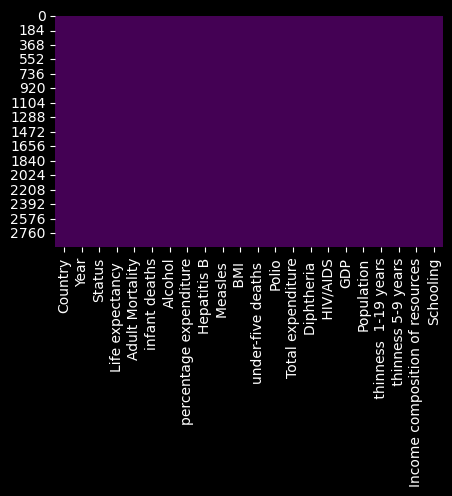

In [75]:
#Visualizing the missing values
plt.figure(figsize=(5,3))
sns.heatmap(df.isnull(),cbar=False,cmap='viridis')

In [76]:
# Viewing the data statistics
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Year,2938.0,2.007519e+03,4.613841e+00,2000.00000,2004.000000,2.008000e+03,2.012000e+03,2.015000e+03
Life expectancy,2938.0,6.922493e+01,9.507640e+00,36.30000,63.200000,7.200000e+01,7.560000e+01,8.900000e+01
Adult Mortality,2938.0,1.647964e+02,1.240803e+02,1.00000,74.000000,1.440000e+02,2.270000e+02,7.230000e+02
infant deaths,2938.0,3.030395e+01,1.179265e+02,0.00000,0.000000,3.000000e+00,2.200000e+01,1.800000e+03
Alcohol,2938.0,4.602861e+00,3.916288e+00,0.01000,1.092500,4.160000e+00,7.390000e+00,1.787000e+01
percentage expenditure,2938.0,7.382513e+02,1.987915e+03,0.00000,4.685343,6.491291e+01,4.415341e+02,1.947991e+04
Hepatitis B,2938.0,8.094046e+01,2.258685e+01,1.00000,80.940461,8.700000e+01,9.600000e+01,9.900000e+01
Measles,2938.0,2.419592e+03,1.146727e+04,0.00000,0.000000,1.700000e+01,3.602500e+02,2.121830e+05
BMI,2938.0,3.832125e+01,1.992768e+01,1.00000,19.400000,4.300000e+01,5.610000e+01,8.730000e+01
under-five deaths,2938.0,4.203574e+01,1.604455e+02,0.00000,0.000000,4.000000e+00,2.800000e+01,2.500000e+03


In [77]:
#Renaming some column names as they contain trailing spaces.
df_copy= df.rename(columns={"Country": "country", "Year": "year", "Status": "status", "Life expectancy ":"life_expectancy",	
                         "Adult Mortality": "adult_mortality", "infant deaths":"infant_deaths", "Alcohol": "alcohol", 
                         "percentage expenditure": "percentage_expenditure",	"Hepatitis B": "hepatitisb", "Measles ": "measles",	
                         " BMI ": "bmi", "under-five deaths ": "under_five_deaths", "Polio": "polio", "Total expenditure": "total_expenditure", 
                         "Diphtheria ": "diptheria",	" HIV/AIDS": "hiv/aids", "GDP":"gdp", "Population":"population", 
                         " thinness  1-19 years": "thinness_10to19_years", " thinness 5-9 years": "thinness_5to9_years", 
                         "Income composition of resources":"income_comp_of_resources", "Schooling":"schooling"})

In [78]:
df_copy.head()

,country,year,status,life_expectancy,adult_mortality,infant_deaths,alcohol,percentage_expenditure,hepatitisb,measles,bmi,under_five_deaths,polio,total_expenditure,diptheria,hiv/aids,gdp,population,thinness_10to19_years,thinness_5to9_years,income_comp_of_resources,schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [79]:
df_copy["life_expectancy"].unique()

array([65.        , 59.9       , 59.5       , 59.2       , 58.8       ,
       58.6       , 58.1       , 57.5       , 57.3       , 57.        ,
       56.7       , 56.2       , 55.3       , 54.8       , 77.8       ,
       77.5       , 77.2       , 76.9       , 76.6       , 76.2       ,
       76.1       , 75.3       , 75.9       , 74.2       , 73.5       ,
       73.        , 72.8       , 73.3       , 73.6       , 72.6       ,
       75.6       , 75.4       , 75.1       , 74.9       , 74.7       ,
       74.4       , 74.1       , 73.8       , 73.4       , 72.9       ,
       72.3       , 71.7       , 71.6       , 71.4       , 71.3       ,
       52.4       , 51.7       , 51.1       , 56.        , 51.        ,
       49.6       , 49.1       , 48.7       , 48.2       , 47.7       ,
       47.4       , 47.1       , 46.8       , 46.5       , 45.7       ,
       45.3       , 76.4       , 75.7       , 75.2       , 75.        ,
       74.8       , 74.6       , 74.        , 76.3       , 76.  

In [80]:
df_copy.life_expectancy.value_counts()

life_expectancy
73.0    45
75.0    33
78.0    31
73.6    28
73.9    25
        ..
43.1     1
49.5     1
49.0     1
55.1     1
45.4     1
Name: count, Length: 363, dtype: int64

In [81]:
fig=px.histogram(df_copy,x='life_expectancy',template='plotly_dark')
fig.show()

In [82]:
fig=px.violin(df_copy,x='status',y='life_expectancy',color='status',template='plotly_dark',box=True,title='Life expectancy Based on Countries status')
fig.show()

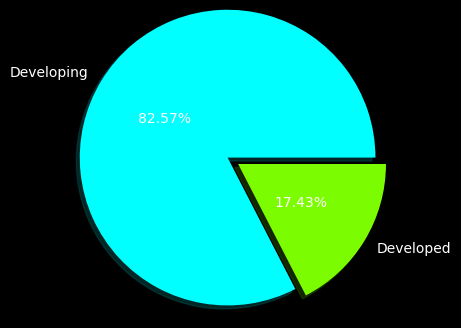

In [121]:
labels = df_copy.status.value_counts().keys()
values = df_copy.status.value_counts().values

plt.figure(figsize=(6,4))
plt.pie(values,labels=labels,explode=(0.1,0),shadow=True,autopct='%1.2f%%',pctdistance=0.5,radius=1.2,colors=['aqua','lawngreen'])
plt.show();

In [83]:
fig=px.line(df_copy.sort_values(by='year'),x='year',y='life_expectancy',animation_frame='country',animation_group='year',color='country',markers=True,template='plotly_dark',title='<b> Country wise Life Expectancy over Years')
fig.show()

In [84]:
px.scatter(df_copy,y='adult_mortality',x='life_expectancy',color='country',size='life_expectancy',template='plotly_dark',opacity=0.6,title='<b> Life Expectancy Versus Adult Mortality')

In [85]:
px.scatter(df_copy.sort_values(by='year'),y='infant_deaths',x='life_expectancy',template='plotly_dark',size='year',color='country',opacity=0.6,title='<b>Life Expectancy Versus Infant Deaths of Countries in every Year')

In [86]:
'''
# Create a scatter plot with varying color and size
plt.figure(figsize=(20,8))
plt.scatter(
    df_copy['life_expectancy'],
    df_copy['schooling'],
    c=df_copy['total_expenditure'],
    cmap='viridis',
    s=df_copy['total_expenditure'] * 10,  # Adjust the multiplier for appropriate size scaling
    alpha=0.7,
    edgecolors='black',
    linewidth=1 )

# Add colorbar
plt.colorbar(label='Total Expenditure')

# Add labels and title
plt.xlabel('Life Expectancy')
plt.ylabel('Schooling')
#plt.title('Scatter Plot with Varying Color and Size')

# Add legend
plt.legend()

# Display the plot
plt.show()'''

"\n# Create a scatter plot with varying color and size\nplt.figure(figsize=(20,8))\nplt.scatter(\n    df_copy['life_expectancy'],\n    df_copy['schooling'],\n    c=df_copy['total_expenditure'],\n    cmap='viridis',\n    s=df_copy['total_expenditure'] * 10,  # Adjust the multiplier for appropriate size scaling\n    alpha=0.7,\n    edgecolors='black',\n    linewidth=1 )\n\n# Add colorbar\nplt.colorbar(label='Total Expenditure')\n\n# Add labels and title\nplt.xlabel('Life Expectancy')\nplt.ylabel('Schooling')\n#plt.title('Scatter Plot with Varying Color and Size')\n\n# Add legend\nplt.legend()\n\n# Display the plot\nplt.show()"

In [87]:
import plotly.graph_objects as go
# Create a 2D scatter plot for Life expectancy vs. Schooling
fig = go.Figure()

for country in df_copy['country'].unique():
    country_data = df_copy[df_copy['country'] == country]
    fig.add_trace(go.Scatter(
        x=country_data['total_expenditure'],
        y=country_data['schooling'],
        mode='markers',
        name=country
    ))

fig.update_layout(
    title='Life Expectancy vs. Schooling',
    xaxis_title='Life Expectancy',
    yaxis_title='Schooling',
    template='plotly_dark'
)


# Display the plots
fig.show()

In [88]:
# Create a 3D scatter plot
fig = px.scatter_3d(
    df_copy.sort_values(by='year'),
    y='schooling',
    x='life_expectancy',
    z='total_expenditure',
    template='plotly_dark',
    color='country',
    size='total_expenditure'
)

fig.update_layout(
    title='3D Scatter Plot: Life Expectancy, Schooling, and Total Expenditure',
    scene=dict(
        xaxis_title='Life Expectancy',
        yaxis_title='Schooling',
        zaxis_title='Total Expenditure'
    )
)

# Display the plot
fig.show()

In [89]:
px.scatter_3d(df_copy.sort_values(by='year'),y='adult_mortality',x='life_expectancy',z='infant_deaths',size='life_expectancy',template='plotly_dark',color='country')

In [90]:
px.scatter(df_copy.sort_values(by='year'),y='schooling',x='life_expectancy',animation_frame='year',animation_group='country',template='plotly_dark',color='country',size='life_expectancy',title='<b> Life expectancy Vs Schooling of countries in every year')


In [91]:
px.scatter(df_copy.sort_values(by='year'),y='adult_mortality',x='life_expectancy',animation_frame='year',animation_group='country',color='country',size='life_expectancy',opacity=0.6,template='plotly_dark',title='<b> Life Expectancy Vs Adult Mortality in every year')

In [92]:
px.scatter(df_copy.sort_values(by='year'),y='gdp',x='life_expectancy',animation_frame='year',animation_group='country',template='plotly_dark',color='country',size='life_expectancy',title='<b>Life Expectancy Versus GDP of Countries in every Year')

In [93]:
# Sort the DataFrame by life expectancy in descending order
df = df_copy.sort_values(by='life_expectancy', ascending=False)

# Select the top 10 countries
top_10_countries = df.head(10)

# Create a bar chart using Plotly Express
fig = px.bar(top_10_countries, x='country', y='life_expectancy', color='year',
             title='Yearly Life Expectancy for Top 10 Countries')

# Show the plot
fig.show()

In [94]:
# One-hot encode the 'country' and 'status' columns
df_encoded = pd.get_dummies(df_copy, columns=['country', 'status'], drop_first=True)
# Convert boolean values to numerical (1/0)
df_encoded = df_encoded.astype(int)

In [95]:
df_encoded

,year,life_expectancy,adult_mortality,infant_deaths,alcohol,percentage_expenditure,hepatitisb,measles,bmi,under_five_deaths,polio,total_expenditure,diptheria,hiv/aids,gdp,population,thinness_10to19_years,thinness_5to9_years,income_comp_of_resources,schooling,country_Albania,country_Algeria,country_Angola,country_Antigua and Barbuda,country_Argentina,country_Armenia,country_Australia,country_Austria,country_Azerbaijan,country_Bahamas,country_Bahrain,country_Bangladesh,country_Barbados,country_Belarus,country_Belgium,country_Belize,country_Benin,country_Bhutan,country_Bolivia (Plurinational State of),country_Bosnia and Herzegovina,country_Botswana,country_Brazil,country_Brunei Darussalam,country_Bulgaria,country_Burkina Faso,country_Burundi,country_Cabo Verde,country_Cambodia,country_Cameroon,country_Canada,country_Central African Republic,country_Chad,country_Chile,country_China,country_Colombia,country_Comoros,country_Congo,country_Cook Islands,country_Costa Rica,country_Croatia,country_Cuba,country_Cyprus,country_Czechia,country_Côte d'Ivoire,country_Democratic People's Republic of Korea,country_Democratic Republic of the Congo,country_Denmark,country_Djibouti,country_Dominica,country_Dominican Republic,country_Ecuador,country_Egypt,country_El Salvador,country_Equatorial Guinea,country_Eritrea,country_Estonia,country_Ethiopia,country_Fiji,country_Finland,country_France,country_Gabon,country_Gambia,country_Georgia,country_Germany,country_Ghana,country_Greece,country_Grenada,country_Guatemala,country_Guinea,country_Guinea-Bissau,country_Guyana,country_Haiti,country_Honduras,country_Hungary,country_Iceland,country_India,country_Indonesia,country_Iran (Islamic Republic of),country_Iraq,country_Ireland,country_Israel,country_Italy,country_Jamaica,country_Japan,country_Jordan,country_Kazakhstan,country_Kenya,country_Kiribati,country_Kuwait,country_Kyrgyzstan,country_Lao People's Democratic Republic,country_Latvia,country_Lebanon,country_Lesotho,country_Liberia,country_Libya,country_Lithuania,country_Luxembourg,country_Madagascar,country_Malawi,country_Malaysia,country_Maldives,country_Mali,country_Malta,country_Marshall Islands,country_Mauritania,country_Mauritius,country_Mexico,country_Micronesia (Federated States of),country_Monaco,country_Mongolia,country_Montenegro,country_Morocco,country_Mozambique,country_Myanmar,country_Namibia,country_Nauru,country_Nepal,country_Netherlands,country_New Zealand,country_Nicaragua,country_Niger,country_Nigeria,country_Niue,country_Norway,country_Oman,country_Pakistan,country_Palau,country_Panama,country_Papua New Guinea,country_Paraguay,country_Peru,country_Philippines,country_Poland,country_Portugal,country_Qatar,country_Republic of Korea,country_Republic of Moldova,country_Romania,country_Russian Federation,country_Rwanda,country_Saint Kitts and Nevis,country_Saint Lucia,country_Saint Vincent and the Grenadines,country_Samoa,country_San Marino,country_Sao Tome and Principe,country_Saudi Arabia,country_Senegal,country_Serbia,country_Seychelles,country_Sierra Leone,country_Singapore,country_Slovakia,country_Slovenia,country_Solomon Islands,country_Somalia,country_South Africa,country_South Sudan,country_Spain,country_Sri Lanka,country_Sudan,country_Suriname,country_Swaziland,country_Sweden,country_Switzerland,country_Syrian Arab Republic,country_Tajikistan,country_Thailand,country_The former Yugoslav republic of Macedonia,country_Timor-Leste,country_Togo,country_Tonga,country_Trinidad and Tobago,country_Tunisia,country_Turkey,country_Turkmenistan,country_Tuvalu,country_Uganda,country_Ukraine,country_United Arab Emirates,country_United Kingdom of Great Britain and Northern Ireland,country_United Republic of Tanzania,country_United States of America,country_Uruguay,country_Uzbekistan,country_Vanuatu,country_Venezuela (Bolivarian Republic of),country_Viet Nam,country_Yemen,country_Zambia,country_Zimbabwe,status_Developing
0,2015,65,263,62,0,71,65,1154,19,83,6,8,65,0,584,33736494,17,17,0,10,0,0,0,

In [96]:
# Exclude non-numeric columns before calculating correlation
numerical_columns = df_copy.select_dtypes(include='number').columns
corelation = df_copy[numerical_columns].corr()

# Display the resulting correlation matrix
corelation


,year,life_expectancy,adult_mortality,infant_deaths,alcohol,percentage_expenditure,hepatitisb,measles,bmi,under_five_deaths,polio,total_expenditure,diptheria,hiv/aids,gdp,population,thinness_10to19_years,thinness_5to9_years,income_comp_of_resources,schooling
year,1.000000,0.169623,-0.078861,-0.037415,-0.048168,0.031400,0.089398,-0.082493,0.108327,-0.042937,0.093820,0.081860,0.133853,-0.139741,0.093351,0.014951,-0.047592,-0.050627,0.236333,0.203471
life_expectancy,0.169623,1.000000,-0.696359,-0.196535,0.391598,0.381791,0.203771,-0.157574,0.559255,-0.222503,0.461574,0.207981,0.475418,-0.556457,0.430493,-0.019638,-0.472162,-0.466629,0.692483,0.715066
adult_mortality,-0.078861,-0.696359,1.000000,0.078747,-0.190408,-0.242814,-0.138591,0.031174,-0.381449,0.094135,-0.272694,-0.110875,-0.273014,0.523727,-0.277053,-0.012501,0.299863,0.305366,-0.440062,-0.435108
infant_deaths,-0.037415,-0.196535,0.078747,1.000000,-0.113812,-0.085612,-0.178783,0.501128,-0.227220,0.996629,-0.170674,-0.126564,-0.175156,0.025231,-0.107109,0.548522,0.465590,0.471228,-0.143663,-0.191757
alcohol,-0.048168,0.391598,-0.190408,-0.113812,1.000000,0.339634,0.075447,-0.051055,0.318070,-0.110777,0.213744,0.294898,0.215242,-0.048650,0.318591,-0.030765,-0.416946,-0.405881,0.416099,0.497546
percentage_expenditure,0.031400,0.381791,-0.242814,-0.085612,0.339634,1.000000,0.011679,-0.056596,0.228537,-0.087852,0.147203,0.173414,0.143570,-0.097857,0.888140,-0.024648,-0.251190,-0.252725,0.380374,0.388105
hepatitisb,0.089398,0.203771,-0.138591,-0.178783,0.075447,0.011679,1.000000,-0.090317,0.134929,-0.184413,0.408519,0.050084,0.499958,-0.102405,0.062318,-0.109811,-0.105144,-0.108334,0.150992,0.171755
measles,-0.082493,-0.157574,0.031174,0.501128,-0.051055,-0.056596,-0.090317,1.000000,-0.175925,0.507809,-0.136146,-0.104569,-0.141861,0.030899,-0.068060,0.236250,0.224742,0.221007,-0.115764,-0.122609
bmi,0.108327,0.559255,-0.381449,-0.227220,0.318070,0.228537,0.134929,-0.175925,1.000000,-0.237586,0.282156,0.231814,0.281059,-0.243548,0.276645,-0.063238,-0.532025,-0.538911,0.479837,0.508105
under_five_deaths,-0.042937,-0.222503,0.094135,0.996629,-0.110777,-0.087852,-0.184413,0.507809,-0.237586,1.000000,-0.188703,-0.128269,-0.195651,0.038062,-0.110640,0.535864,0.467626,0.472099,-0.161533,-0.207111


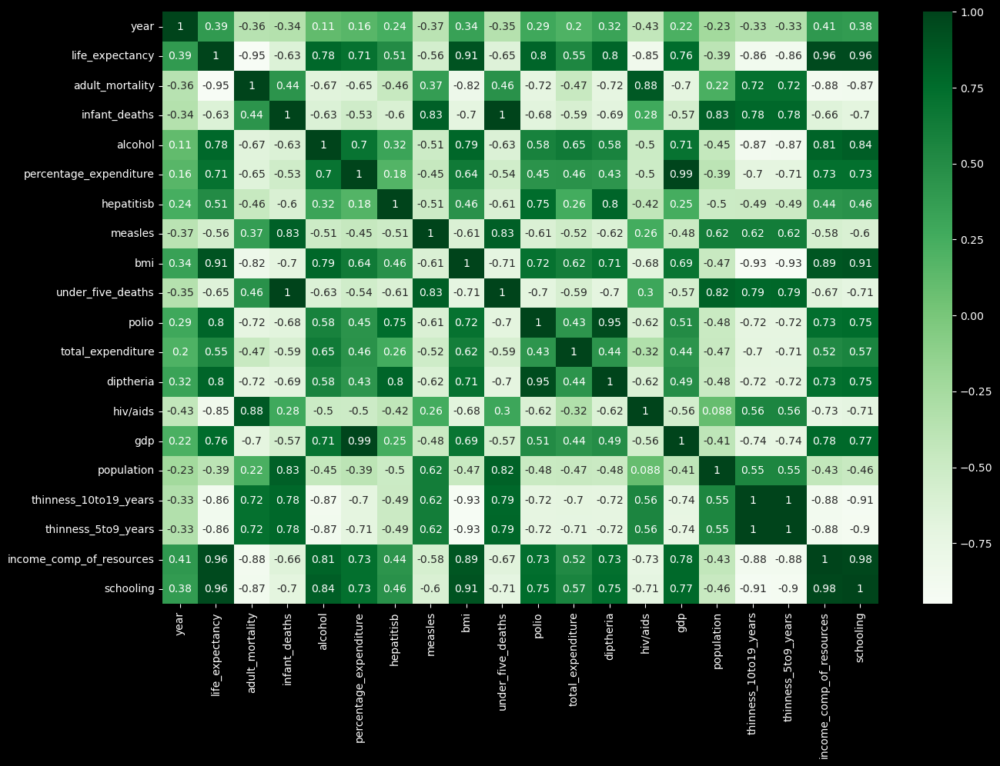

In [97]:
plt.figure(figsize=(15,10))
sns.heatmap(corelation.corr(),annot=True,cmap='Greens')
plt.show()

In [98]:
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Select only numerical columns
numerical_columns = df_copy.select_dtypes(include='number')

# Add a constant column to the features (required for statsmodels)
X = sm.add_constant(numerical_columns)

# Calculate VIF for each feature
vif_data = pd.DataFrame()
vif_data["Variable"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Display the VIF values
vif_data


,Variable,VIF
0,const,215324.972183
1,year,1.142544
2,life_expectancy,5.482848
3,adult_mortality,2.115368
4,infant_deaths,185.114210
5,alcohol,1.634174
6,percentage_expenditure,5.042780
7,hepatitisb,1.405003
8,measles,1.384422
9,bmi,1.771085


The variables with high VIF values are "infant_deaths," "under_five_deaths," "thinness_10to19_years," and "thinness_5to9_years." These high VIF values suggest that these variables are highly correlated with other predictors in the model, indicating potential multicollinearity.

Here are the variables with their respective VIF values:

* infant_deaths": 185.114210
* under_five_deaths": 184.378090
* thinness_10to19_years": 8.784089
* thinness_5to9_years": 8.861208


When independent features are highly correlated i.e. have same nature, then they introduce the element of variance in the model which is called Multi-Collinearity. Multi-Collinearity is not good for our models so we will be dropping these columns to avoid that.

In [99]:
# Select only numerical columns
numerical_columns = df_copy.select_dtypes(include='number')

# Calculate the correlation matrix
correlation_matrix = numerical_columns.corr()

# Set a threshold for correlation (0.8)
correlation_threshold = 0.8

# Create a mask for highly correlated variables
highly_correlated = (correlation_matrix.abs() > correlation_threshold) & (correlation_matrix != 1)

# Identify pairs of highly correlated variables
correlation_pairs = [(i, j) for i in range(correlation_matrix.shape[0])
                      for j in range(i+1, correlation_matrix.shape[1])
                      if highly_correlated.iloc[i, j]]

# Print the pairs of highly correlated variables
print("Pairs of Highly Correlated Variables:")
for pair in correlation_pairs:
    print(f"{numerical_columns.columns[pair[0]]} and {numerical_columns.columns[pair[1]]}")

# Remove one variable from each highly correlated pair
# In this example, we'll remove the second variable in each pair
columns_to_drop = set()
for pair in correlation_pairs:
    columns_to_drop.add(numerical_columns.columns[pair[1]])

# Drop the identified columns
numerical_columns_filtered = numerical_columns.drop(columns=columns_to_drop, axis=1)

# Display the resulting DataFrame with removed variables
print("\nDataFrame with Removed Variables:")
numerical_columns_filtered.head()

Pairs of Highly Correlated Variables:
infant_deaths and under_five_deaths
percentage_expenditure and gdp
thinness_10to19_years and thinness_5to9_years

DataFrame with Removed Variables:


,year,life_expectancy,adult_mortality,infant_deaths,alcohol,percentage_expenditure,hepatitisb,measles,bmi,polio,total_expenditure,diptheria,hiv/aids,population,thinness_10to19_years,income_comp_of_resources,schooling
0,2015,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,6.0,8.16,65.0,0.1,33736494.0,17.2,0.479,10.1
1,2014,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,58.0,8.18,62.0,0.1,327582.0,17.5,0.476,10.0
2,2013,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,62.0,8.13,64.0,0.1,31731688.0,17.7,0.470,9.9
3,2012,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,67.0,8.52,67.0,0.1,3696958.0,17.9,0.463,9.8
4,2011,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,68.0,7.87,68.0,0.1,2978599.0,18.2,0.454,9.5


In [100]:
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Add a constant column to the features (required for statsmodels)
X = sm.add_constant(numerical_columns_filtered)

# Calculate VIF for each feature
vif_data = pd.DataFrame()
vif_data["Variable"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Display the VIF values
vif_data

,Variable,VIF
0,const,213439.695624
1,year,1.132467
2,life_expectancy,5.215779
3,adult_mortality,2.107815
4,infant_deaths,2.173071
5,alcohol,1.591576
6,percentage_expenditure,1.282784
7,hepatitisb,1.398470
8,measles,1.373990
9,bmi,1.741939


In [125]:
# Import necessary libraries
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error

In [131]:
# Select features (X) and target variable (y)
y = numerical_columns_filtered['life_expectancy']
X = numerical_columns_filtered.drop(['life_expectancy'],axis=1)

In [132]:
# Standardize features 
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [133]:
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)

In [134]:
# Initialize linear regression model
reg_lr = LinearRegression()

In [135]:
# Train the model
reg_lr.fit(X_train, y_train)

LinearRegression()

In [136]:
reg_lr.coef_

array([-0.03282234, -2.54630102, -0.06955447,  0.31318886,  0.65186454,
       -0.38219943, -0.43163972,  0.85009803,  0.64779199,  0.11905989,
        1.03107338, -2.50581877,  0.06689303, -0.28814628,  1.47382091,
        2.32955788])

In [137]:
# Make predictions on the test set
y_pred = reg_lr.predict(X_test)

In [138]:
print("Linear Regression Model Training Score: ", reg_lr.score(X_train, y_train))

Linear Regression Model Training Score:  0.8068704722943083


In [139]:
print("Linear Regression Model Testing Score: ", reg_lr.score(X_test, y_test))

Linear Regression Model Testing Score:  0.8088161578011686


In [140]:
# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

In [141]:
# Display evaluation metrics
print(f'Mean Squared Error (MSE): {mse}')
print(f"MAE:", mae)
print(f'R-squared (R2): {r2}')

Mean Squared Error (MSE): 17.866351003914883
MAE: 3.0631418087020323
R-squared (R2): 0.8088161578011686


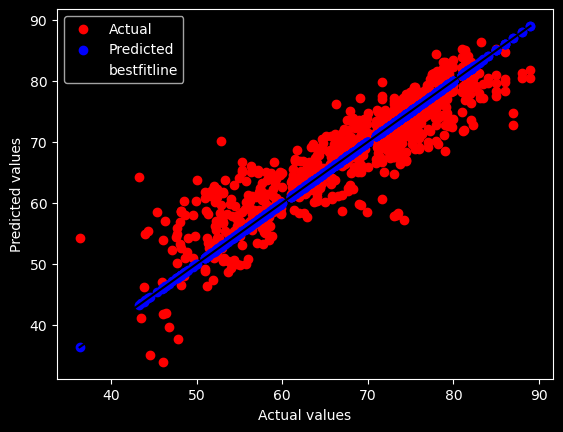

In [145]:
plt.scatter(y_test, y_pred, c='red', label='Actual')
plt.scatter(y_test, y_test, c='blue', label='Predicted')
plt.xlabel("Actual values")
plt.ylabel("Predicted values")
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='black', linestyle='-', label='bestfitline')
plt.legend()